# Adding payments to our app

In this final section, we are going to add a subscription paywall to our streamlit. This means that anyone who did not subscribe and pay won't be able to use your app. We can offer a trial period, which is a good thing to allow people to test your app and determine if they really want to pay for it.

To setup a subscription system for our app, we are going to setup a few things:
* `st-paywall`: streamlit paywall is a python package designed by a streamlit engineer to add a paywall to streamlit. The documentation for this package can be found here: https://st-paywall-fork.readthedocs.io/en/latest/#home
* Stripe: we are going to setup a Stripe account with a subscription based product, a payment link and an API key
* Google OAuth: we are going to use Google's authentication system to allow users to login with a Google account, that is how we will determine if a user actually already subscribed or not to the app.

## Setting up st-paywall

We are going to modify the previous folder you created to work on the Streamlit financial app. 

### Installing st-paywall

We first need to install `st-paywall`. We are going to do so by adding it to the `requirements.txt` file. We'll do it this way because we will re-deploy our app after these modification.

Open `requirements.txt` and add `st-paywall`. Your file should now contain 3 lines:
```
streamlit
pyautogen
st-paywall
```

Then, load your virtual environment if you're not already in it and install all the packages in the `requirements.txt` file using:

`pip install -r requirements.txt`

This should only install `st-paywall` as you should already have `streamlit` and `autogen` in your virtual environment.

Wait for the installation to end.

### Creating the secrets.toml file

st-paywall will look for a file at a specific location to find all the information needed to connect you to the various services needed. This file won't be created for you by st-paywall, so we'll have to create it.

#### Create the .streamlit folder

In VSCode, right click on your folder and choose `New Folder...`, then, name the folder `.streamlit``. 

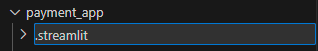

#### Create the secrets.toml file

Now right-click on this folder in VSCode and choose `New File...`. Name the file `secrets.toml`

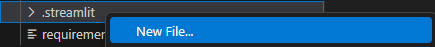

The `secrets.toml` file will be in `./.streamlit/secrets.toml`

Copy and paste the following content in that file:

```python
testing_mode = true
payment_provider = "stripe" #stripe if using Stripe
stripe_api_key_test = "sk_test_51Pe..." #only needed if using Stripe
stripe_api_key = "sk_live_51Pej..." #only needed if using Stripe
stripe_link = "https://buy.stripe.com/eVa2..." #only needed if using Stripe
stripe_link_test = "https://buy.stripe.com/test_9AQ..." #only needed if using Stripe
client_id = "390126158543-r7hkq1m..."
client_secret = "GOCSPX-vpjp..."
redirect_url_test = 'http://localhost:8501/'
redirect_url = "http://localhost:8501/"
bmac_api_key = "eyJ0eXAiOiJKV1Qi..." #only needed if using buy me a coffee
bmac_link = "https://buymeacoffee.com/ilylabs" #only needed if using buy me a coffee
```

We are for now going to use the testing mode (`testing_mode = true`), meaning that we will test everything without any money. And we are going to have to fill each of the parameters that begin with `stripe` and `client` in this file. To do so, we'll need a Stripe account (you should already have your Google Cloud account setup at this point).

st=-paywall also supports "Buy me a Coffee" but it does not currently work properly, so we'll be using Stripe only.

## Setup the Google related parameters

For the Google part, we are going to need to setup the two following lines of the `streamlit/secrets.toml`:
```python
client_id = "390126158543-r7hkq1m..."
client_secret = "GOCSPX-vpjp..."
```

To do so, we'll first need to setup a Google OAuth screen.

### Setting up Google Oauth screen

Search for `API` in your Google Cloud Console, and select `API & services`.  
Then, choose `Oauth consent screen` in the left tab.

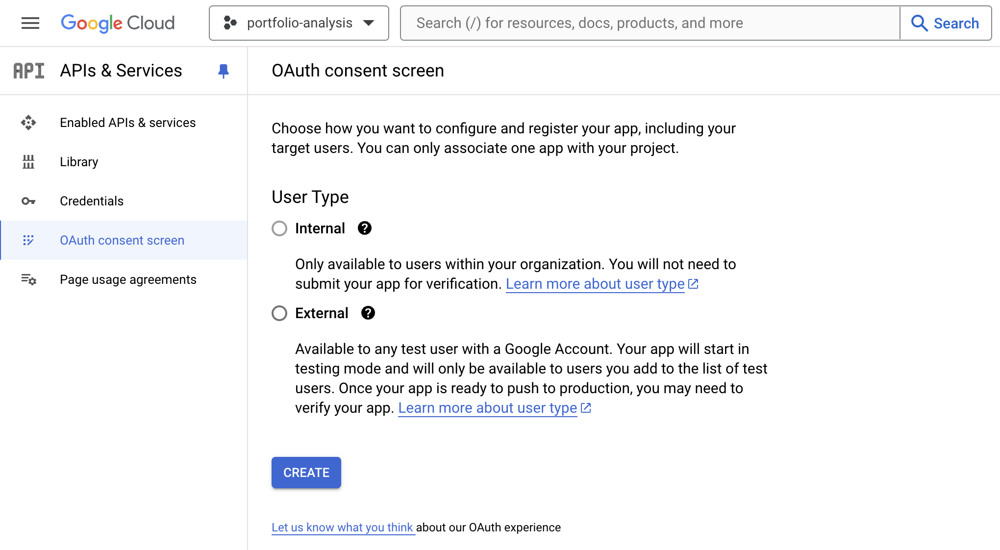

You will then choose `External`, because we want anyone to be able to use our app.

Fill the "Oauth screen consent page":

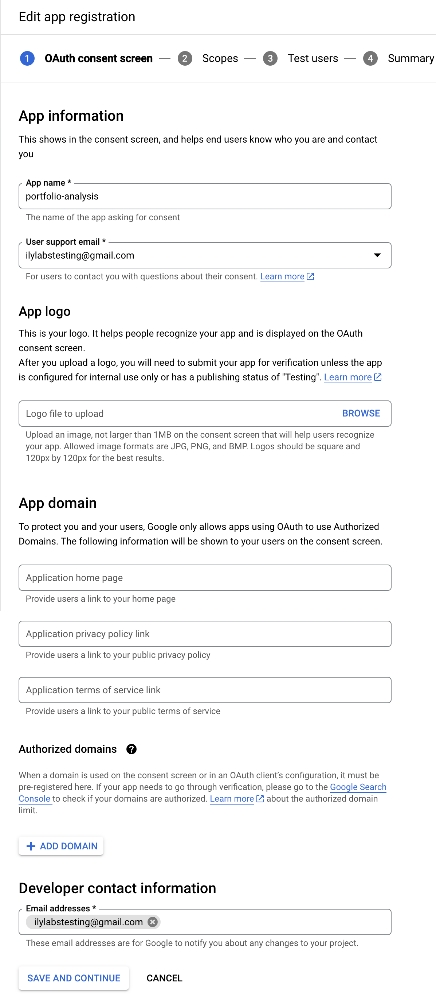

Next, for the "Scope" page, we need to add the `.../auth/userinfo.email`. Select it, click "Update" at the bottom of the tab and then "Save and Continue" to move to "Test Users".

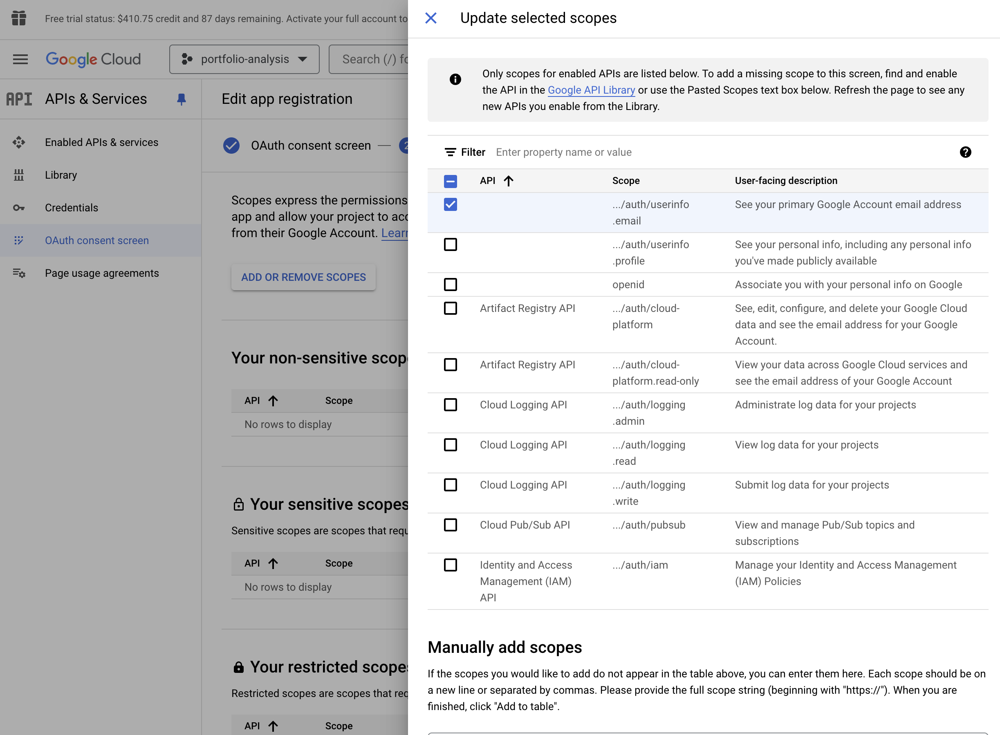

In "Test Users", add yourself so that you can test the app and click "Save and Continue:

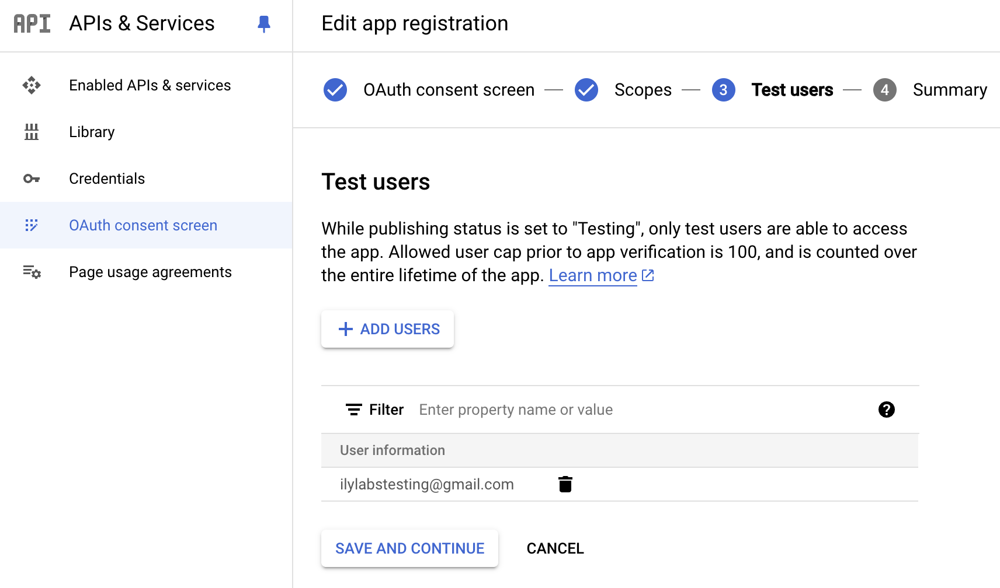

That's it for the Oauth screen!

### Setting up Oauth client ID

Now we'll setup an Oauth client ID for your app.

To do that, select the "Credentials" element in the left side tab in "API and services" and click `Create credentials > Oauth client ID`:

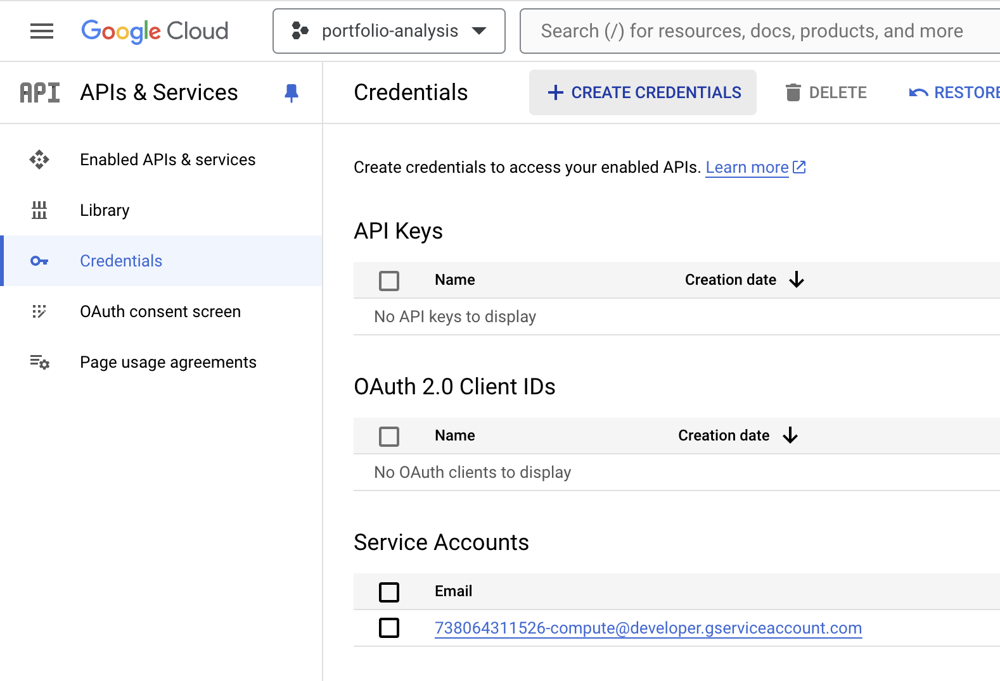

In application type, choose `Web application`:

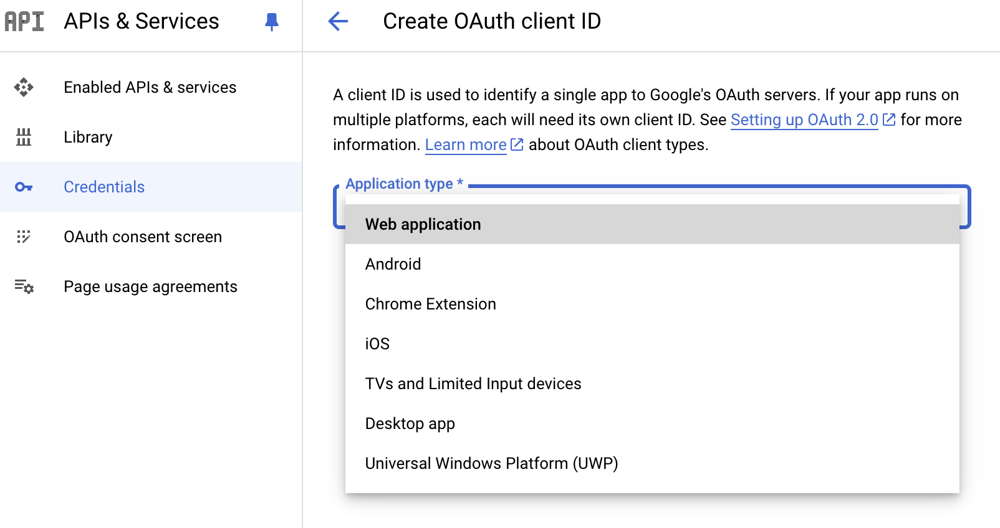

In the next screen, you'll need to add two "Authorized JavaScript origins" and two "Authorized redirect URIs":
* `http://localhost:8501/`: This is the address from which your st-paywall app will contact Google when we'll test your app locally
* The address that was provided for your deployed portfolio-analysis app by Cloud Run, you can retrieve it if you go to your machine in Cloud Run, in my case, it was: https://portfolio-analysis-3aokrw2fba-ue.a.run.app

This is how my "Create Oauth client ID" looked like in my case:

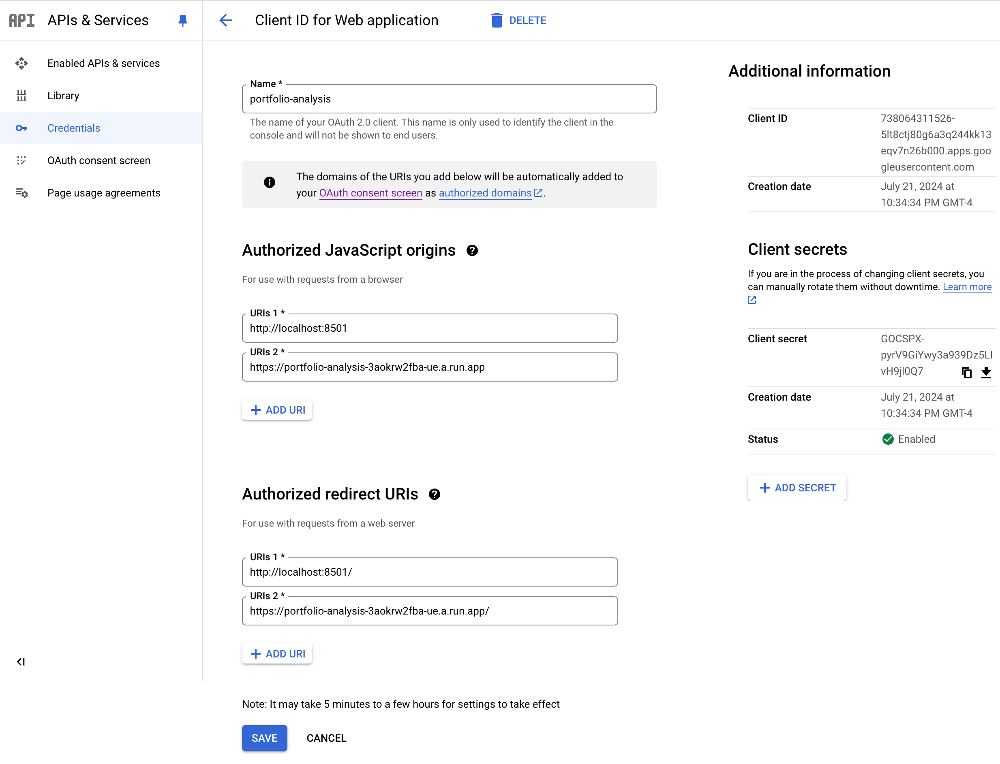

Then click "Create" at the bottom of the page.

You will now have a pop-up that shows you your `client_id` and `client_secret` variable. 

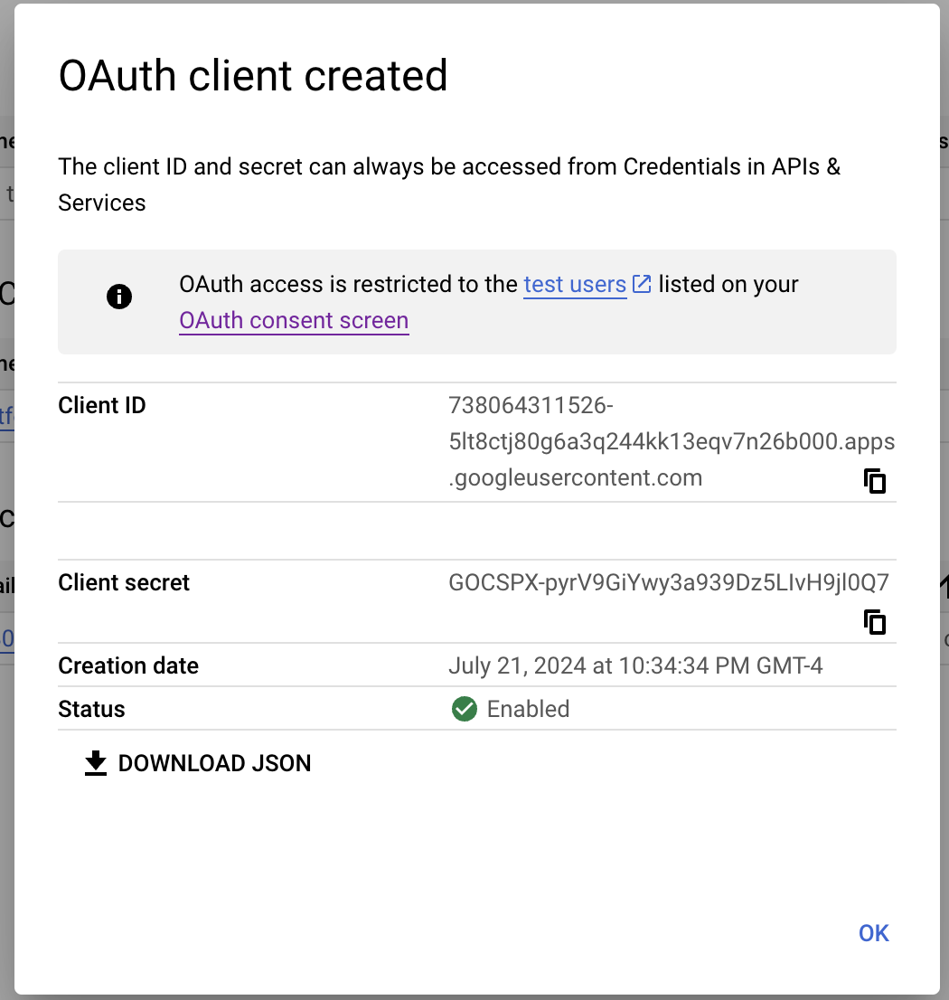

Copy each one of them and paste them in your `.streamlit/secret.toml` file. In my case, this is how my file looks like at this point:

```python
testing_mode = true
payment_provider = "stripe" #stripe if using Stripe
stripe_api_key_test = "sk_test_51Pe..." #only needed if using Stripe
stripe_api_key = "sk_live_51Pej..." #only needed if using Stripe
stripe_link = "https://buy.stripe.com/eVa2..." #only needed if using Stripe
stripe_link_test = "https://buy.stripe.com/test_9AQ..." #only needed if using Stripe
client_id = "738064311526-5lt8ctj80g6a3q244kk13eqv7n26b000.apps.googleusercontent.com"
client_secret = "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"
redirect_url_test = 'http://localhost:8501/'
redirect_url = "http://localhost:8501/"
bmac_api_key = "eyJ0eXAiOiJKV1Qi..." #only needed if using buy me a coffee
bmac_link = "https://buymeacoffee.com/ilylabs" #only needed if using buy me a coffee
```

And that's it for the Google part!

We are now going to move to collecting the data we need from Stripe.

## Setup the Stripe related parameters

### Create a Stripe account

* Sign up for Stripe: this process is not hard, but it'll require personal information from you.

### Payment subscription link - Test mode

Once you have your Stripe account, create a Payment Link from here: https://dashboard.stripe.com/test/payment-links/create

* Start by writing the name of the product you want to create, we'll call ours here `portfolio-analysis`:

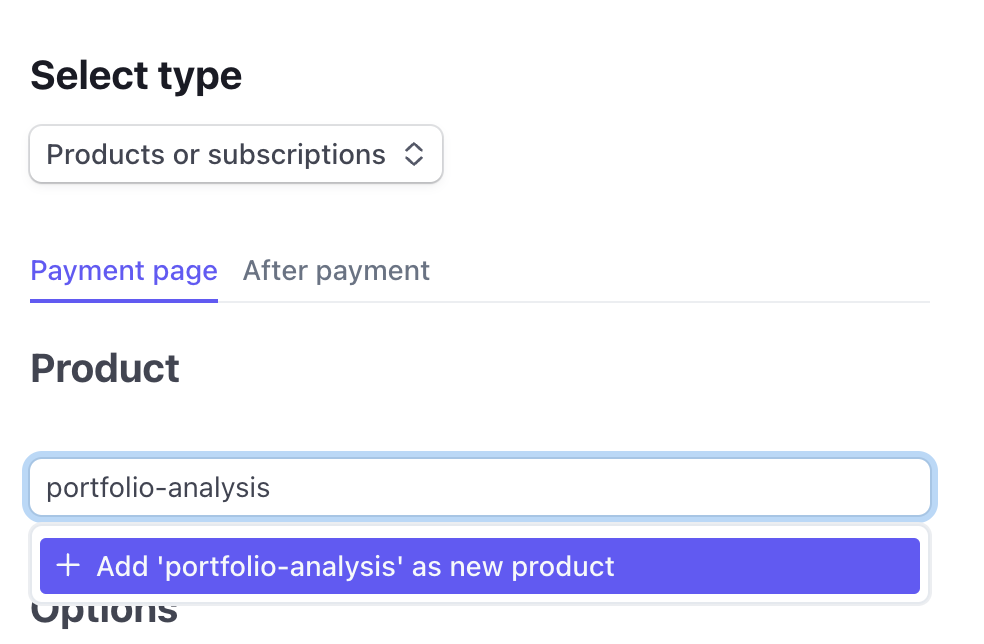

* You'll be asked to create a new product with the same name, click on that, and fill the product tab that'll pop up as you'd like to bill for your product. This is how I filled mine, click "Add product" when you're done:

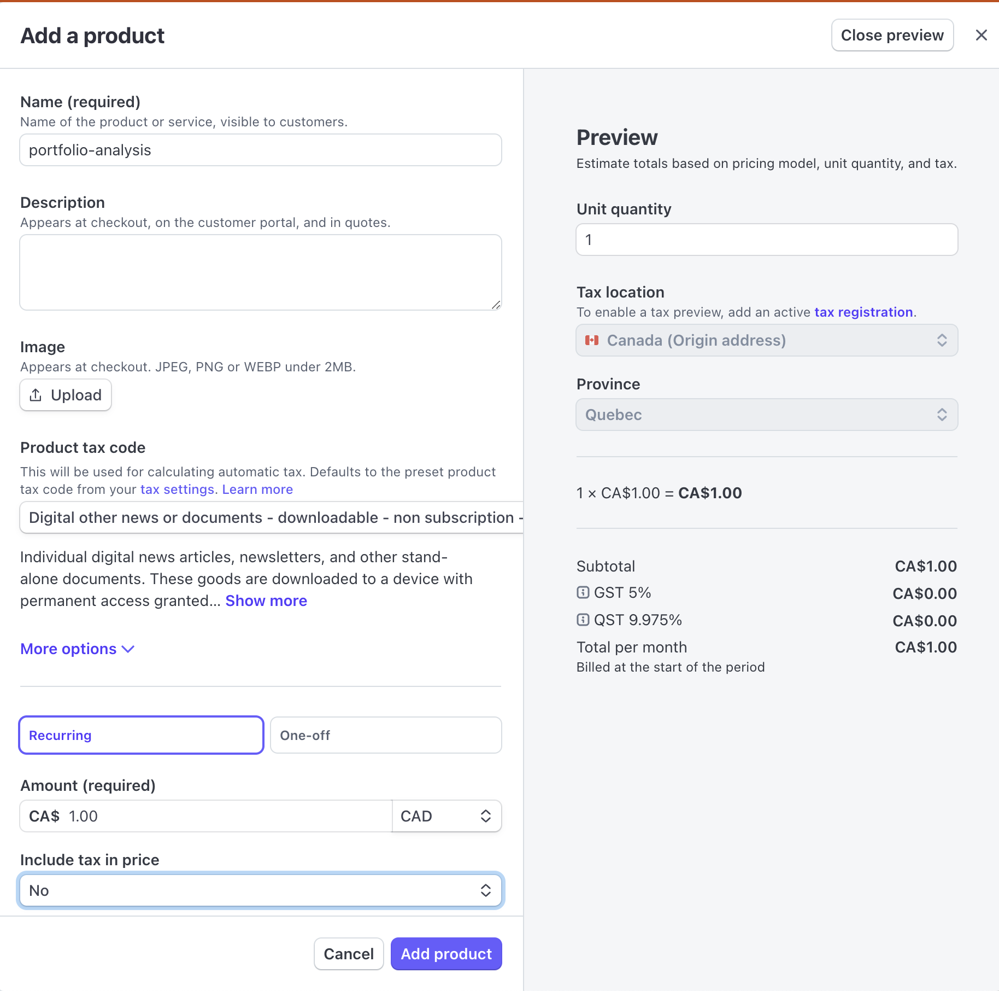

* Then, add the information as you'd like to bill your in the "Payment page" tab, this is how I filled mine:

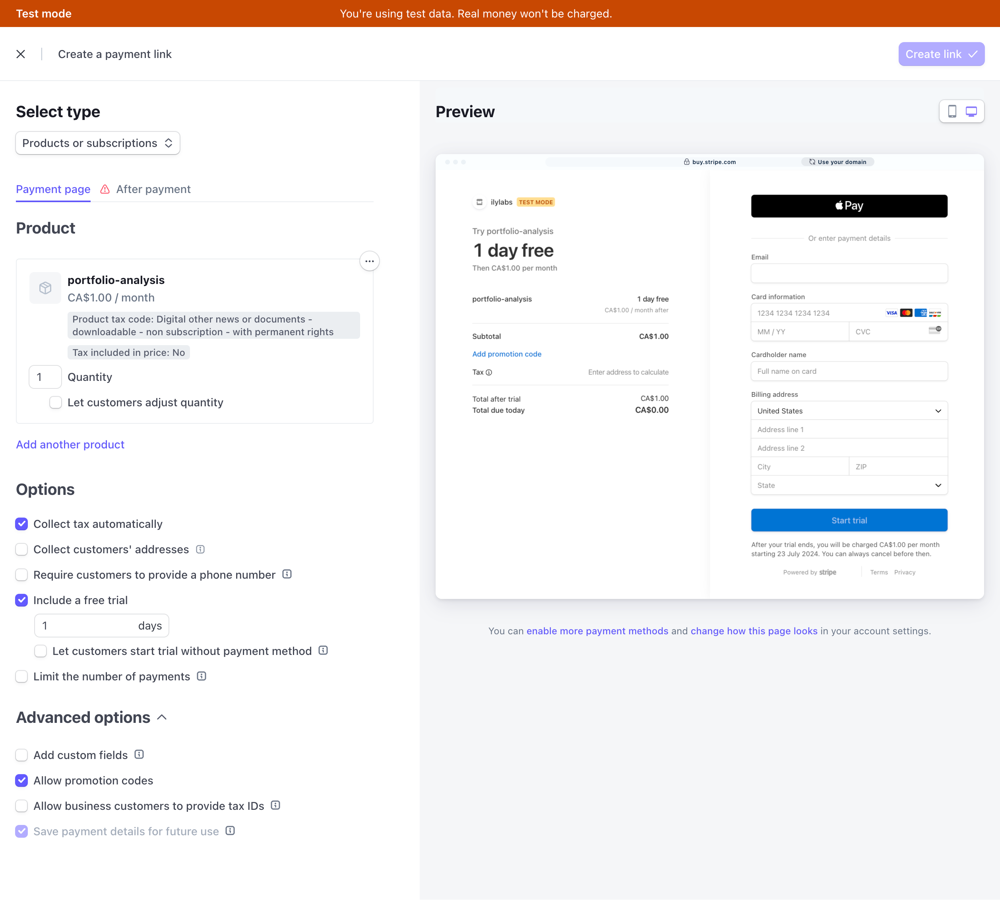

* And finally, you need to fill the "After payment" tab. We'll need to **go back to this page later**. For now, we'll choose the "Show confirmation page" after payment, but later, we might want to come back here to switch that to "Redirect customers to your website" after payment, which will make the experience smoother. We'll do this once we deploy the final version of our app with payments activated and working.

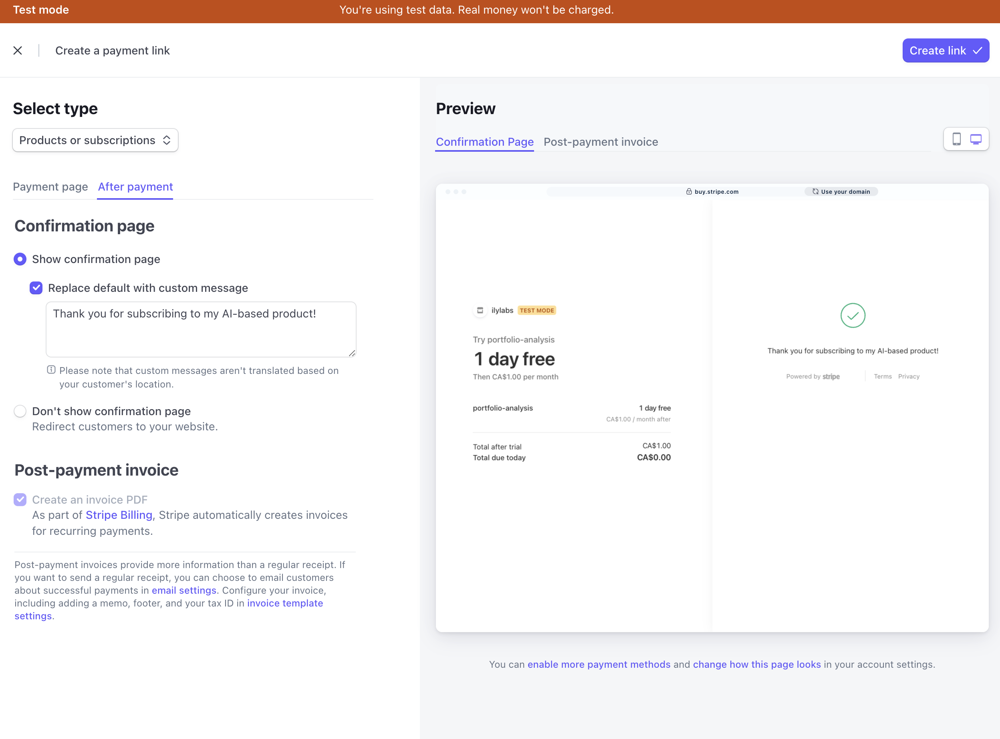

* Then **Create Link**.

* You will then have your Payment link, copy it and go add it to your `secrets.toml` file in the `stripe_link_test` field, mine looks like this: `https://buy.stripe.com/test_cN2eVkf13bgL6QMeUV`

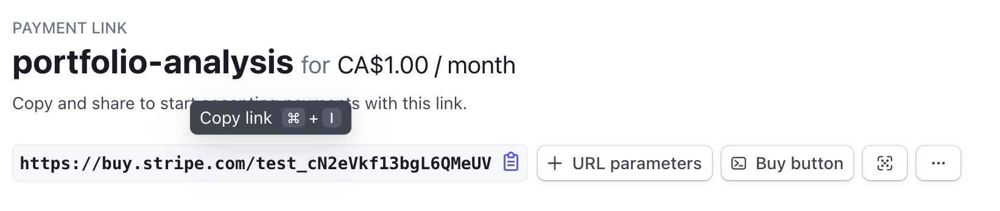


### Standard API key - Test mode

Next, we have to go get our Stripe API key for the test mode, you'll be able to find it here: https://dashboard.stripe.com/test/apikeys

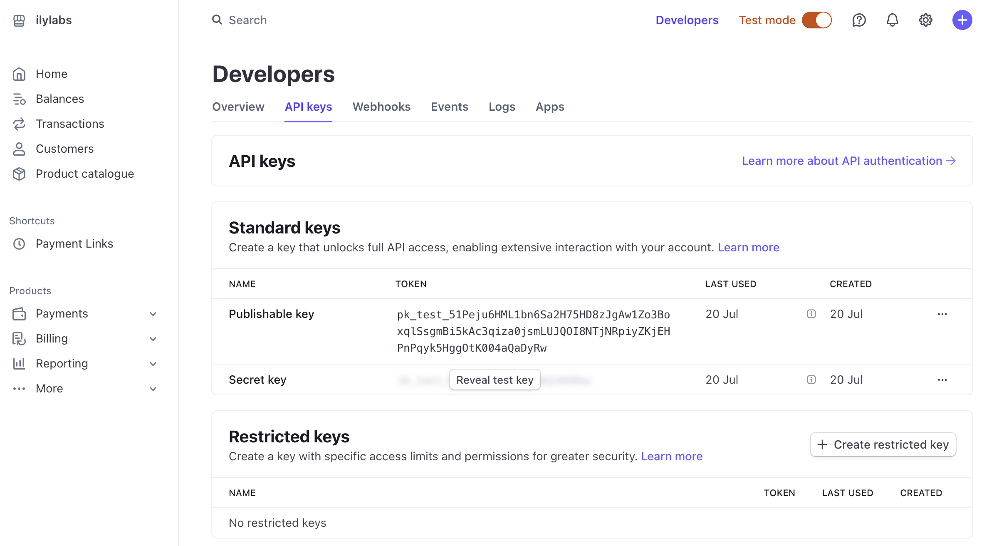

Copy your API Secret key after clicking `Reveal test key`. This key should start with `sk_test_...`.
Paste it in your `secrets.toml` in the `stripe_api_key_test`.  

Your `secrets.toml` file should look like this at this point:

```python
testing_mode = true
payment_provider = "stripe" #stripe if using Stripe
stripe_api_key_test = "sk_test_51Peju6HMLgh67wjkD6EaHLTIQCAujBXJjsdnsaoj7sdnoiqwGw4Yt4DaANlSkmmorVpodn1628chslajhB9" #only needed if using Stripe
stripe_api_key = "sk_live_51Pej..." #only needed if using Stripe
stripe_link = "https://buy.stripe.com/eVa2..." #only needed if using Stripe
stripe_link_test = "https://buy.stripe.com/test_9AQ..." #only needed if using Stripe
client_id = "738064311526-5lt8ctj80g6a3q244kk13eqv7n26b000.apps.googleusercontent.com"
client_secret = "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"
redirect_url_test = 'http://localhost:8501/'
redirect_url = "http://localhost:8501/"
bmac_api_key = "eyJ0eXAiOiJKV1Qi..." #only needed if using buy me a coffee
bmac_link = "https://buymeacoffee.com/ilylabs" #only needed if using buy me a coffee
```

And that's it for the Stripe test mode!

After testing, we'll have to come back to Stripe to retrieve the production version of the subscription link and the API key once we validate that everything is working properly with the test version.

You could also retrieve the equivalent production version (live) of each of these links immediately as shown in the video.

## Setting up our app.py file

Something we'll do right now because it's quite easy to do is modify our app.py file so that it will be paywalled and ask for a subscription payment. To do so, we'll open our previous streamlit portfolio-analysis app `S06-02-Application-financial_report.py` and we're going to modify it.

(The final version of this file is provided `S06-04-Add_subscriptions.py`)

### Modifications necessary

To transform our streamlit app into a paywalled streamlit app, we'll have to add the following at the beginning of our code after the imports:

```python
from st_paywall import add_auth

st.set_page_config(layout="wide")
st.title("🎈 My AI agents portfolio analysis app 🎈")
st.markdown("""
Welcome to my portfolio analysis app!
            
Because running AI agents is expensive, you'll need to subscribe to access my app, but not to worry, you'll have 24 hours of trial time to determine if you really need this app before having to commit for a cheap and affordable monthly subscription. Enjoy!
            """)

add_auth(
    required=True,
    login_button_text="Login with Google",
    login_button_color="#FD504D",
    login_sidebar=False,
)

# After authentication, the email and subscription status is stored in session state
# We can display them so the user knows which account they're using and if 
st.write("You are logged in as " + st.session_state.email)
st.write("Subscription status? " + str(st.session_state.user_subscribed))
```

This code snippet will have to be before our code app begins, this code snippet will stop any python code after it from executing or appearing unless the user is a subscriber.

You can see the final version here: `S06-04-Add_sunscription.py`  
Copy the content and paste it in a file named `app.py` that is in the same folder as your `.streamlit` folder.


## Testing the app locally

Now that we have:
* Google Oauth
* Stripe Test version
* st-paywall code in our app
We can test it locally!

To do so, simply run the app in the folder where you have your `.streamlit\secrets.toml`. In my case, this is what my folder looks like:

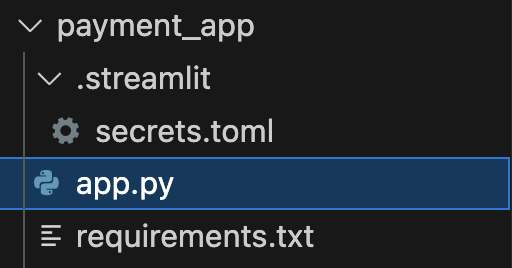

Run `app.py` with:

`streamlit run app.py`

You should get your app but right after the intro text, you should have a `Login with Google` button:

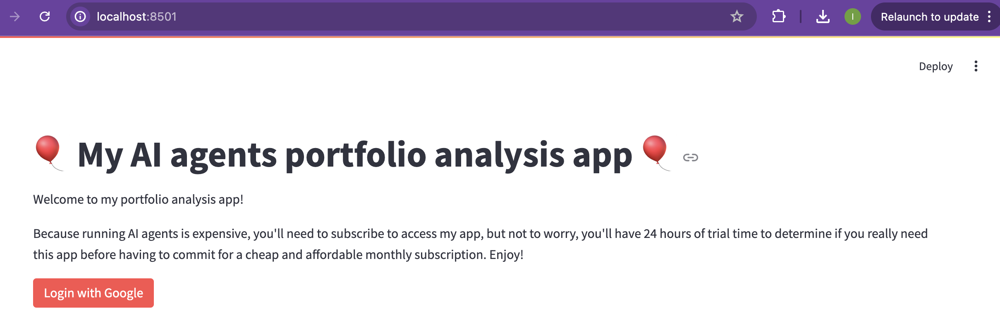

For now, you can only use the e-mail address we [previously authorized in the Oauth activation](#Setup-the-Google-related-parameters).
Use that e-mail address to login, click Continue to authorize the login.

You should now get the same limited version of your app but you'll also have a "Subscribe now!" button.

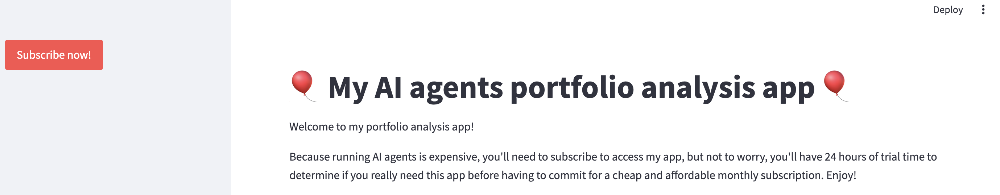

Click the "Subscribe now!" button. Since we're running the test version of Stripe, we can use "test credit card" provided by Stripe to test our payment system without paying any money. Test card numbers for different types of cards can be found here: https://docs.stripe.com/testing#cards

Choose a test card and use it to Subscribe to your app. This is how I filled mine based on the Visa test card:

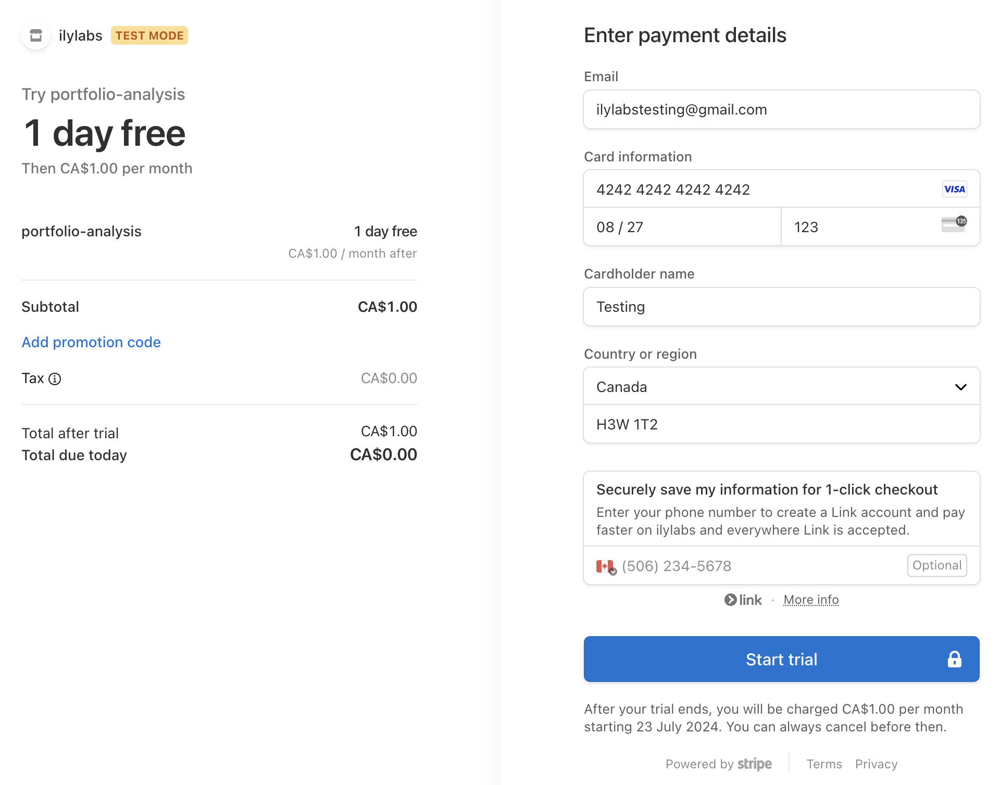

And then click "Start trial"!

Now, if you go back to your app and login with the same e-mail, you will have access to the app!

The next step is now to deploy the test version of the app on Google Cloud Run and ensure that everything works properly, after what, we will deploy the non-test version that will require real payments to use your app!

## Deploy the test version on Google Cloud Run

We will now deploy the test version to Google Cloud Run and ensure everything works smoothly.

### Code setup on Google Cloud shell

Go to your Cloud Shell Editor in Google Cloud: https://console.cloud.google.com/cloudshelleditor

Create a folder called `portfolio-analysis-payment` in the root of your Cloud Shell Editor.

We need to put the necessary code inside this folder, we will need:
* `app.py`: the same app file we just created and tested. Create the file and copy your code in it. A copy of this file is provided with the files for this session (`S06-04-Add_sunscription.py`).
* `requirements.txt`: also the same as the one we just created and used. A copy of this file is provided with the files for this session (`S06-04-requirements.txt`).
* `.streamlit/secrets.toml`: also the same file as the one we're currently working with.
* `Dockerfile`: you can re-use the same docker file as the one you previously used. A copy of this file is provided with the files for this session (`S06-04-Dockerfile`).

We will perform one last change in the `.streamli/secrets.toml` file before testing the app in the Google Cloud Shell. Open the file and 

The structure of your `portfolio-analysis-payment` folder should look like this:

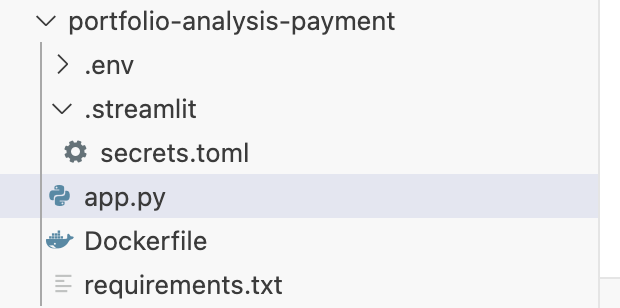

#### Show hidden folders with Google Cloud Shell Editor

When you'll want to create the `.streamlit` folder, the Google Cloud Shell editor will consider that it's a hidden folder and will hide it, you can make hidden folders visible by going to `File > View > Toggle Hidden Files`.

#### Test the app in Google Cloud shell (optional)

If you'd like to, you can validate that your setup in Google Cloud Shell is functional. We will later rely on this version to deploy your app so ensuring that it works now might spare you more problems later.

* To do so, open a terminal with `File > Terminal > New Terminal`.
* Enter the folder you just created with `cd portfolio-analysis-payment`.
* Create a virtual environment with `python -m venv .env`
* Load it once it is finished creating: `source .env/bin/activate`
* Install the packages in your `requirements.txt` file with: `pip install -r requirements.txt`
* Run your app with payment using: `streamlit run app.py --browser.serverAddress=localhost --server.enableCORS=false --server.port 8080`

##### Set the temporary cloud shell link in secrets.toml

* Copy the link to your temporary Cloud Shell machine by clicking on it, in my case, that was: https://8080-cs-5bca9db1-fbda-403a-ada3-daa2c1d6008a.cs-us-east1-vpcf.cloudshell.dev/
* Open your `.streamlit/secrets.toml` file and replace the `redirect_url_test` field by this link.

Mine looked like this:

```python
redirect_url_test = 'https://8080-cs-5bca9db1-fbda-403a-ada3-daa2c1d6008a.cs-us-east1-vpcf.cloudshell.dev/'
```

##### Add the temporary cloud shell link to your Google app Credentials

Go to the `Credentials` page in the `API & Services` category. You can get there by searching for "credentials" in the search area.

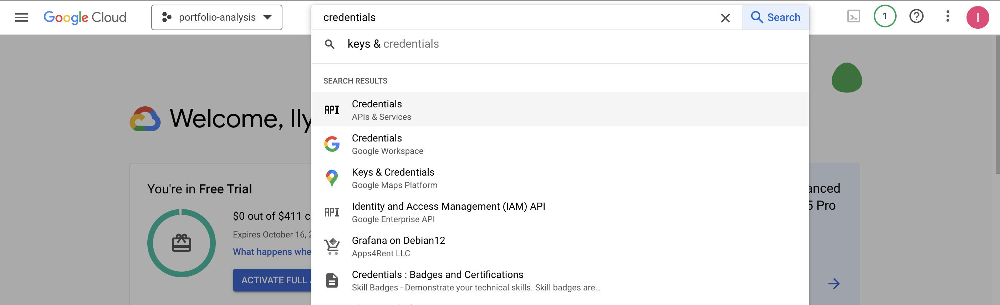

Open your `portfolio-analysis` app in the `OAuth 2.0 Client IDs` and add the link of your temporary Cloud Shell Machine in the `Authorized JavaScript origins` and `Authorized redirect URIs`.

My link was https://8080-cs-5bca9db1-fbda-403a-ada3-daa2c1d6008a.cs-us-east1-vpcf.cloudshell.dev/

This is what my Credentials page looked after this:

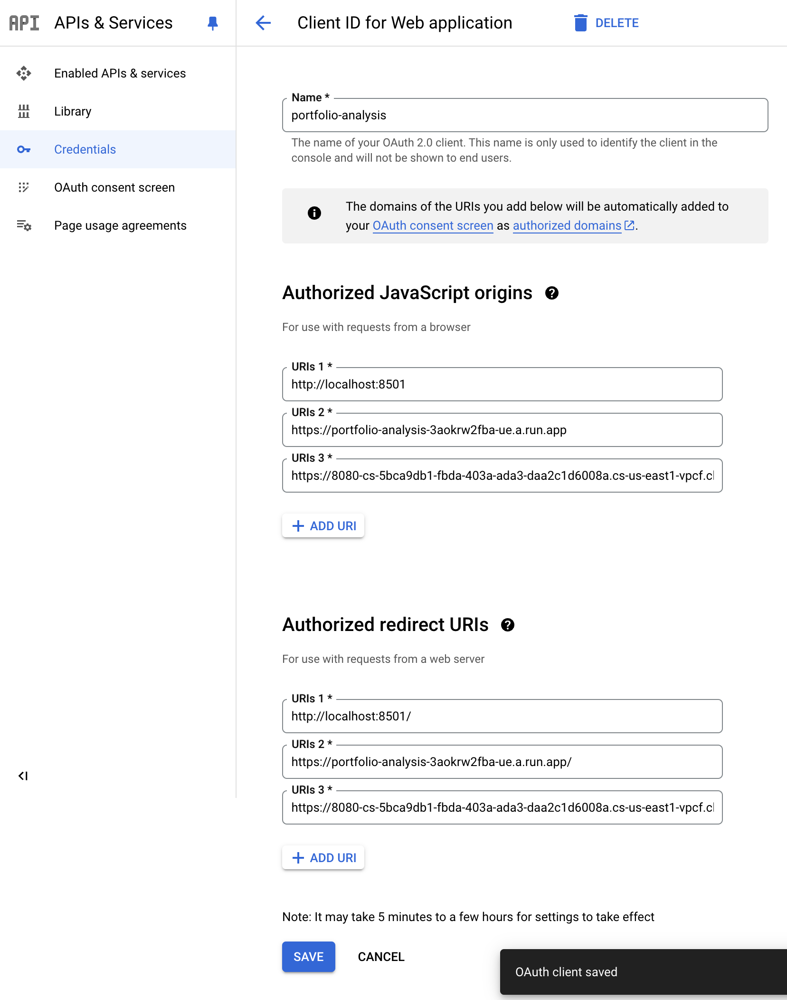

##### Test the app in the Google Cloud shell 

You can now go back to the Cloud Shell Editor and reproduce the following steps if you closed the window and exited your `portfolio-analysis-payment` app folder and virtual environment:

* To do so, open a terminal with `File > Terminal > New Terminal`.
* Enter the folder you just created with `cd portfolio-analysis-payment`.
* Load it once it is finished creating: `source .env/bin/activate`
* Run your app with payment using: `streamlit run app.py --browser.serverAddress=localhost --server.enableCORS=false --server.port 8080`
* The Cloud Shell Editor terminal will provide you with the same link as previously (mine was https://8080-cs-5bca9db1-fbda-403a-ada3-daa2c1d6008a.cs-us-east1-vpcf.cloudshell.dev/) and since we authorized this app in Google Oauth we will be able to login to the app when it uses this link

* Open the link shown in your terminal and ensure that if you login with your authorized e-mail address and ensure that your app works well

### Deploy the test version to Google Cloud Run

Let's now deploy the test version to Google Cloud Run using:

```
gcloud run deploy portfolio-analysis --source .
```

This command will deploy our code to the same virtual machine (`portfolio-analysis`) we previously used, this will overwrite the previous version of our app. The link to reach it should not change, however.

* Click `Àuthorize` when prompted.
* Choose a server that is close to you, or use `us-east-1`
* Allow unauthenticated invocations by pressing `y` then `Enter`
* Wait for the app to deploy on a virtual machine...

Once deployed, click on the link provided and retrieve it in Google Cloud Run and test your app again.

A very important here, in the case where you have authentication problems with Google is to ensure that the link you put [earlier when we setup the Google Oauth](#Setting-up-Oauth-client-ID) is the same as the one for your current Cloud Run (it should be). In my `Authorized javascript origin` and `Authorized redirect URLs` was `https://portfolio-analysis-3aokrw2fba-ue.a.run.app` and my Cloud Run machine still has the same link because I re-used the name `portfolio-analysis` when I deployed my app with payment. 

Another important point is to ensure that you're still logging in with the address we [previously authorized in the Oauth activation page](#Setup-the-Google-related-parameters). Since we're still in testing mode, that address alone can actually log in to this app.

The app should be working for you!

## Deploy the production version on Google Cloud Run

Now that we have ensure that everything works well with a test version, we are going to switch to a production version. This means that: 
1. Anyone will be able to login to the app using their Google Account
2. Stripe will now require a real credit card and real money to subscribe to the app (we'll see that we can still set up a trial period if we'd like to do so).

So let's get started and implement the changes necessary.

### Switching Google Oauth to production mode

The first step will be to set the Google Authentification system to production mode. To do so, we need to go to the `Oauth consent screen` page in the `API & Services` category. You can get there by searching for "Oauth" in the search area.

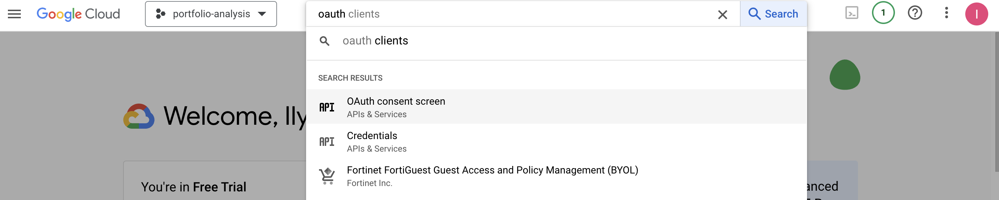

Once there, simply click the `Publish app` button and confirm when prompted to.

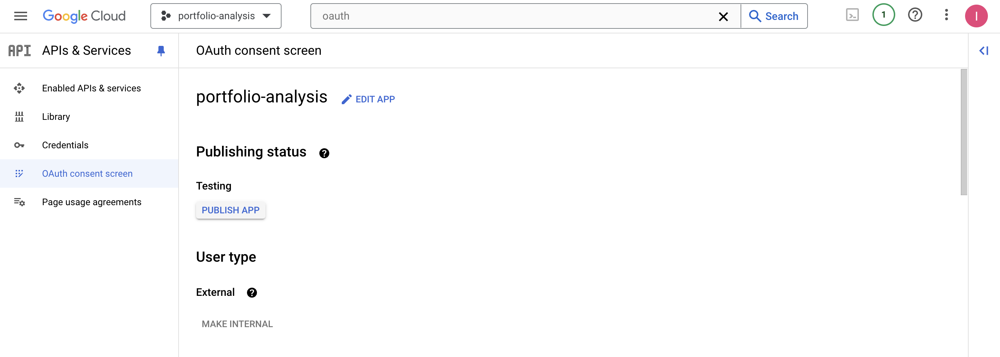

And that's all! Anyone can now login to your app now!

### Setting Stripe to production mode

#### Production payment link

* Go to your Stripe account Test mode: https://dashboard.stripe.com/test/payment-links
* Click on the `...` next to your `portfolio-analysis` app and choose the `Copy to live mode` button.

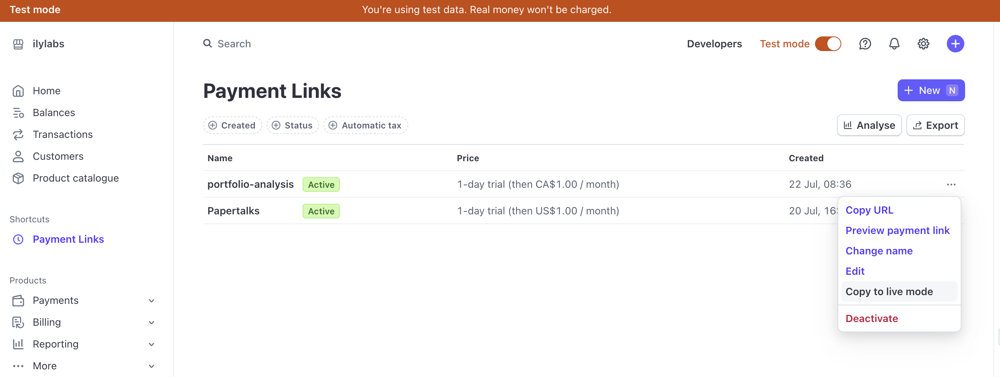

* Then click, switch the switch the `Test mode` to production, the orange banner at the top of the page should now disappear
* Click on the `portfolio-analysis` app

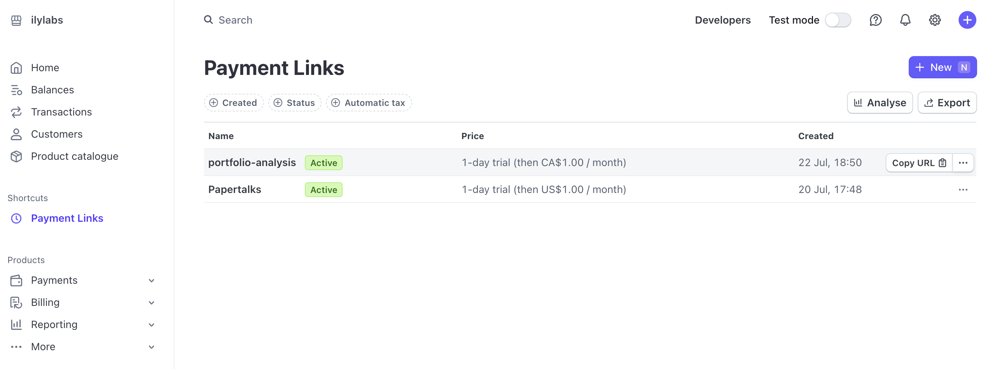

* Copy the payment link:

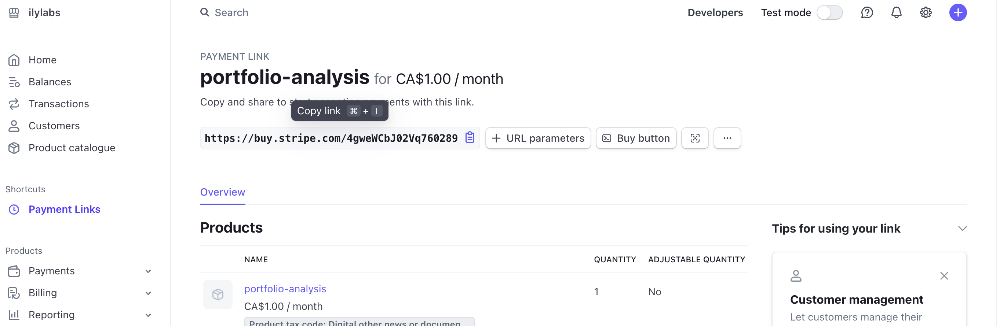

* Paste the payment link in the `stripe_link` field of your `./streamlit/secrets.toml` file in the Google Cloud Shell Editor:

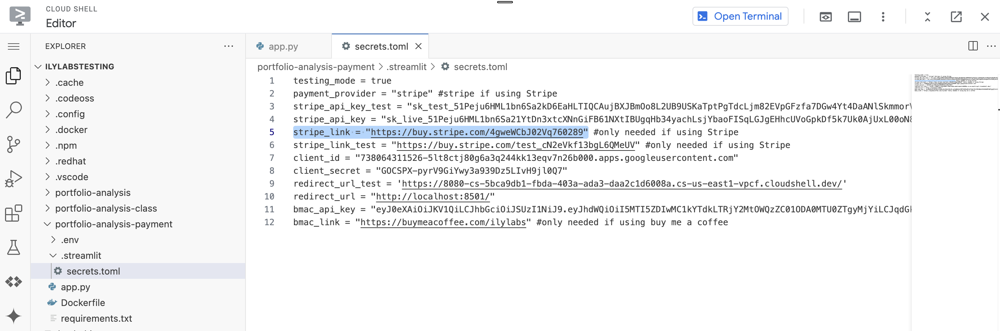

#### Production API key

* Go to your Stripe API key page: https://dashboard.stripe.com/apikeys
* Click on your `Secret key` to copy it, ensure to keep a safe copy somewhere because this key will not be shown to you again. You can however generate a new one using the `+ Create secret Key` button.
* Paste your secret key in the `stripe_api_key` of your `./streamlit/secrets.toml` file in the Google Cloud Shell Editor:

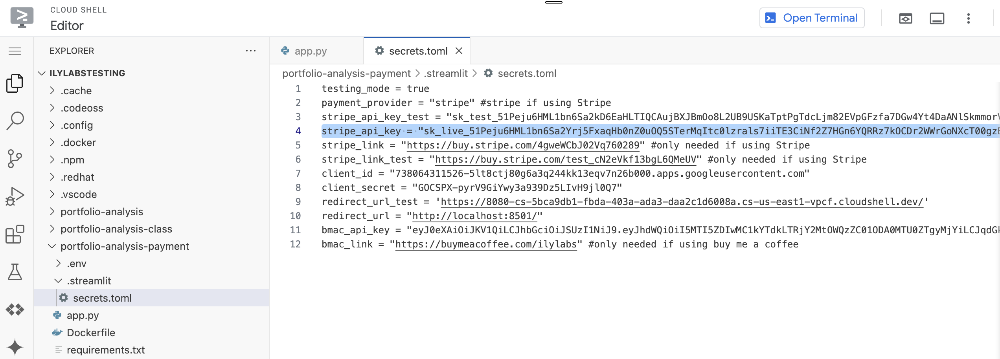


#### Customize the Stripe experience

In this section we'll do some modifications to make our Stripe experience better for our users and ourselves.

##### Redirect to your app after payment

* Go back to the Payment links page, click the `...` and choose `Edit`:

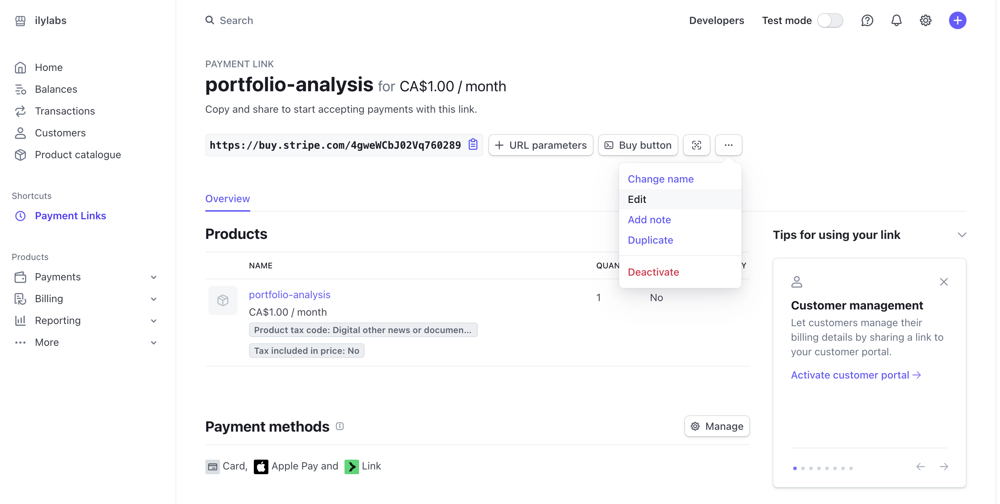

* Go to the `After payment` tab and choose `Don't show confirmation page` and input the link of your `portfolio-analysis` Cloud Run machine:

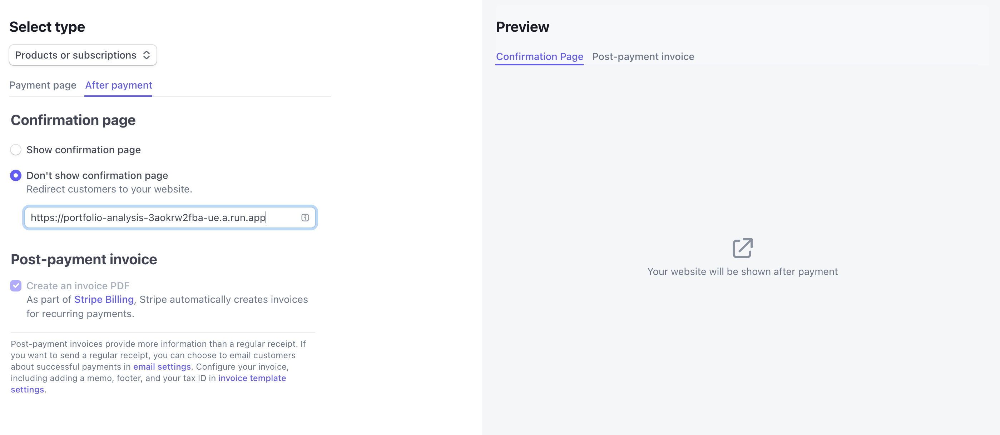

* Then click `Update link`

##### Add a coupon for free access

* Next, go to `Product catalogue` and go to the `Coupons` tab.

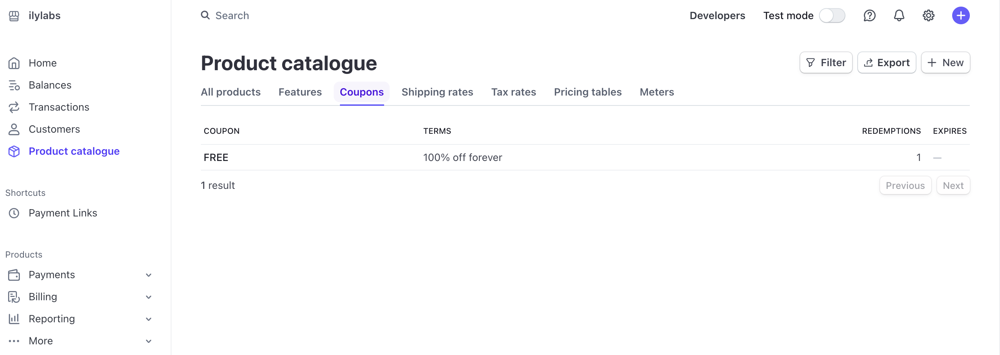

* Create a new coupon by clicking `+ New`
* Create a coupon that will give you a 100% reduction

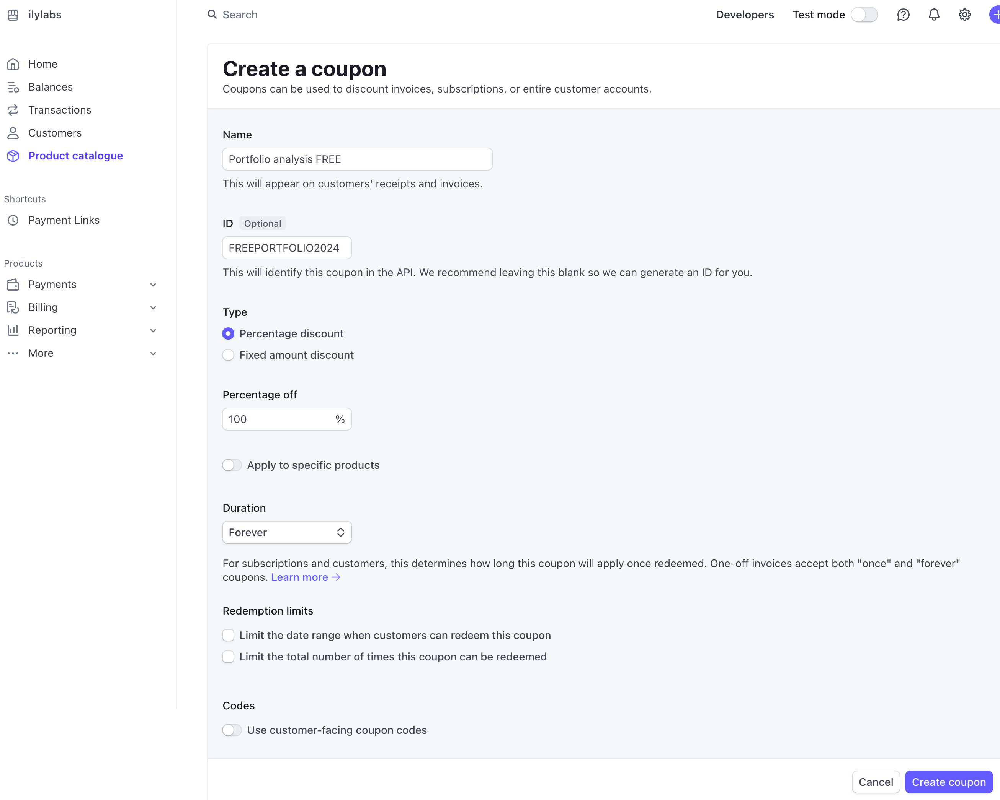

* This means that we'll be able to use promo code `FREEPORTFOLIO2024` to use the app without paying!


### Switch secrets.toml to production mode

We still need to modify two lines in the `secrets.toml` file.

#### Set testing mode to false

In your `./streamlit/secrets.toml`, set the `testing_mode` field to `false`:

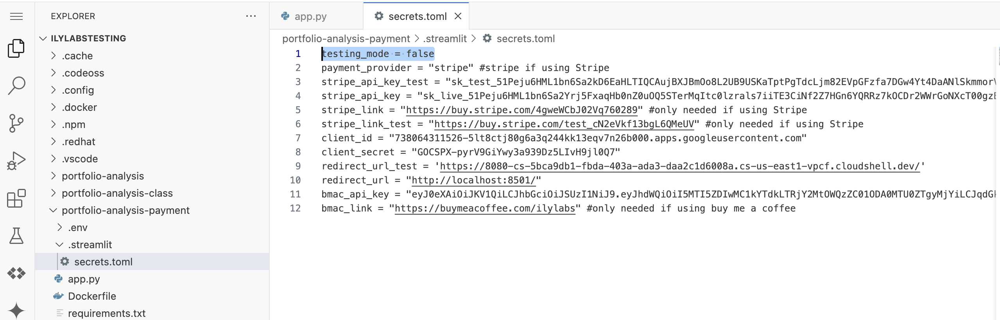

#### Set redirect URL to your Cloud Run machine

* Copy the URL of your `portfolio-analysis` machine from Cloud Run: 

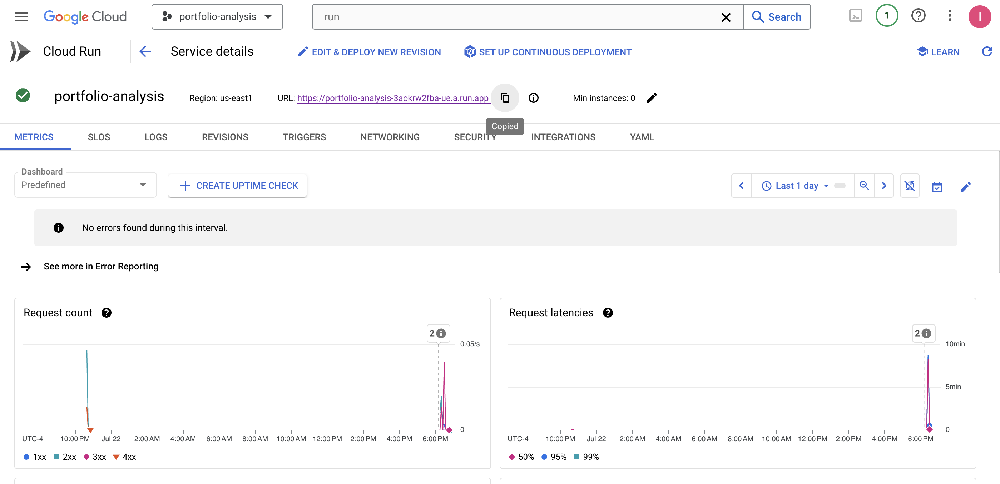

* Paste it in the `redirect_url` field of your `./streamlit/secrets.toml` file in the Google Cloud Shell Editor:

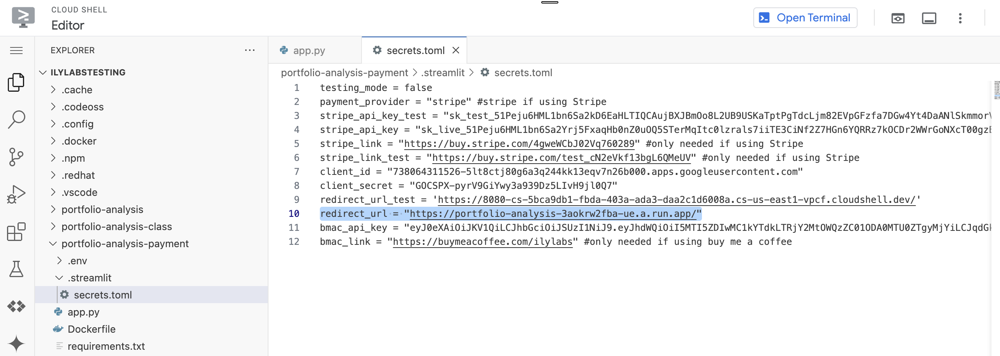

* You will need to add a `/` at the end of the link. This link must be **exactly the same** as the one you put in the [Credentials page](#Setting-up-Oauth-client-ID).

We should now be ready to deploy the production version to Cloud Run!

### Deploy the production ready version

* Go back to your Cloud Shell Editor, ensure that you are in the `portfolio-analysis-payment` folder
* Deploy a new version of t the `portfolio-analysis` app using:

```
gcloud run deploy portfolio-analysis --source .
```

* Choose `us-east-1`
* wait for it to deploy

Go test your app!
